## Technology Focus - Vizgen MERSCOPE

To follow along with this tutorial, you can download via:

```bash
gsutil -m cp -r \
  "gs://vz-merfish2-showcase/202409242358_240916JHHUBC0005XQ-V2V-HubcTMA-V2-BY_VMSC02511/region_R1" \
  .
```

#### Read data into SpatialData format

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import copy
import gzip
import shutil
from pathlib import Path

import anndata as ad
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import spatialdata as sd
import spatialdata_io
from scipy.sparse import csr_matrix
from spatialdata.transformations import (
    get_transformation,
    set_transformation,
)

import segtraq

/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/squidpy/gr/_utils.py:23: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  CAN_USE_SPARSE_ARRAY = Version(anndata.__vers

##### MERSCOPE 
We first read the single cell data generated based on MERSCOPE segmentation.

In [ ]:
merscope_path = Path.home() / "segtraq/data/breast/Merscope/region_R1"

sdata_merscope = spatialdata_io.merscope(merscope_path)

INFO     The column "global_x" has now been renamed to "x"; the column "x" was already present in the dataframe,   
         and will be dropped.                                                                                      
INFO     The column "global_y" has now been renamed to "y"; the column "y" was already present in the dataframe,   
         and will be dropped.                                                                                      


/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:946: UserWarning: The index of the dataframe is not monotonic increasing. It is recommended to sort the data to adjust the order of the index before calling .parse() (or call `parse(sort=True)`) to avoid possible problems due to unknown divisions.
  return method.__get__(obj, cls)(*args, **kwargs)
/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/legacy_api_wrap/__init__.py:88: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  return fn(*args_all, **kw)


Since MERSCOPE does not provide nucleus segmentation masks, we first run cellpose segmentation on the DAPI image and add the nucleus shapes to the SpatialData object via `add_nuc_shapes_via_cellpose`. For improved cellpose performance, a higher resolution (`scale3` or lower) can be used but this will drastically increase memory usage of cellpose.

In [4]:
segtraq.add_nuc_shapes_via_cellpose(
    sdata_merscope,
    channel="DAPI",
    images_data_key="scale4/image",
    shapes_key="Merscope_region_R1_polygons",
    images_key="Merscope_region_R1_z3",
)

channels deprecated in v4.0.1+. If data contain more than 3 channels, only the first 3 channels will be used


##### Proseg-Resegmentation

Next, we read the MERSCOPE data resegmented with Proseg (v2.0.5).

In [5]:
# -------------------------
# Table (counts + metadata)
# -------------------------
counts_df = pd.read_csv(merscope_path / "proseg_output" / "expected-counts.csv.gz", compression="gzip")
var = pd.DataFrame(index=counts_df.columns.astype(str))
var.index.name = "gene_symbol"

# Round to nearest int and convert to CSR
X = np.rint(counts_df.values).astype(np.int32, copy=False)
X = csr_matrix(X)

obs = pd.read_csv(merscope_path / "proseg_output" / "cell-metadata.csv.gz", compression="gzip")
obs["region"] = pd.Categorical(["cell_boundaries"] * len(obs))
adata = ad.AnnData(X=X, obs=obs, var=var)
table_sd = sd.models.TableModel.parse(adata, region_key="region", region="cell_boundaries", instance_key="cell")


# -------------------------
# Polygons -> per-layer shapes + raster labels (2D per z) + MIP
# -------------------------
def decompress_geojson(gz_path: Path) -> Path:
    if gz_path.suffix == ".gz":
        json_path = gz_path.with_suffix("")  # strip .gz
        if not json_path.exists():
            with gzip.open(gz_path, "rt") as f_in, open(json_path, "w") as f_out:
                shutil.copyfileobj(f_in, f_out)
        return json_path
    return gz_path


# reading the polygons
shapes_dict = {}

polygons_layers_gdf = gpd.read_file(
    decompress_geojson(merscope_path / "proseg_output" / "cell-polygons-layers.geojson.gz")
)

# Polygon layers for multiple z stacks
for z in sorted(polygons_layers_gdf["layer"].unique()):
    # select the current layer
    layer_gdf = polygons_layers_gdf[polygons_layers_gdf["layer"] == z]
    # filter out empty or missing geometries
    layer_gdf = layer_gdf[~layer_gdf.geometry.is_empty & layer_gdf.geometry.notna()]
    # putting everything into a spatialdata-compatible format
    layer_shapes = layer_gdf.set_index("cell")["geometry"].to_frame().copy()
    shapes_dict[f"cell_boundaries_z{int(z)}"] = sd.models.ShapesModel.parse(layer_shapes)

polygons_gdf = gpd.read_file(decompress_geojson(merscope_path / "proseg_output" / "cell-polygons.geojson.gz"))
gdf = polygons_gdf[~polygons_gdf.geometry.is_empty & polygons_gdf.geometry.notna()]
shapes = gdf.set_index("cell")["geometry"].to_frame().copy()
shapes_dict["cell_boundaries"] = sd.models.ShapesModel.parse(shapes)

# -------------------------
# Points (transcripts)
# -------------------------
tx = pd.read_csv(merscope_path / "proseg_output" / "transcript-metadata.csv.gz", compression="gzip")
tx["gene"] = tx["gene"].astype("category")

transcripts_sd = sd.models.PointsModel.parse(tx)

# -------------------------
# Assemble SpatialData
# -------------------------
sdata_proseg = sd.SpatialData(
    shapes=shapes_dict,
    points={"transcripts": transcripts_sd},
    tables={"table": table_sd},
)

/home/lazic/.local/share/uv/python/cpython-3.11.13-linux-x86_64-gnu/lib/python3.11/functools.py:909: ImplicitModificationWarning: Transforming to str index.
  return dispatch(args[0].__class__)(*args, **kw)


We will copy data that is independent from Proseg segmentation (e.g. `images`, `shapes["nucleus_boundaries"]`) from the MERSCOPE to the Proseg SpatialData object. We will also copy transformations for points and shapes in `sdata_proseg` to align them with the MERSCOPE data. 

In [6]:
sdata_proseg.images = sdata_merscope.images
sdata_proseg.shapes["nucleus_boundaries"] = sdata_merscope.shapes["nucleus_boundaries"]

In [7]:
merscope_transformation = get_transformation(sdata_merscope.shapes["Merscope_region_R1_polygons"])
set_transformation(sdata_proseg.shapes["cell_boundaries"], merscope_transformation)
set_transformation(sdata_proseg.shapes["cell_boundaries_z0"], merscope_transformation)
set_transformation(sdata_proseg.shapes["cell_boundaries_z1"], merscope_transformation)
set_transformation(sdata_proseg.shapes["cell_boundaries_z2"], merscope_transformation)
set_transformation(sdata_proseg.shapes["cell_boundaries_z3"], merscope_transformation)
set_transformation(sdata_proseg.points["transcripts"], merscope_transformation)

### Initialize SegTraQ objects

Next, we initialize SegTraQ objects, the core interface for computing SegTraQ metrics. During initialization, all inputs are are validated via `validate_spatialdata()`. 

Cell IDs are of datatype `str` in points and `int64` in shapes in `sdata_merscope`. We will convert the cell IDs in points to `str`. 

In [8]:
sdata_merscope["Merscope_region_R1_transcripts"]["cell_id"] = sdata_merscope["Merscope_region_R1_transcripts"][
    "cell_id"
].astype("str")

In [ ]:
st_merscope = segtraq.SegTraQ(
    sdata_merscope,
    images_key="Merscope_region_R1_z3",
    tables_cell_id_key="EntityID",
    tables_area_volume_key="volume",
    points_key="Merscope_region_R1_transcripts",
    points_cell_id_key="cell_id",
    points_background_id="-1",
    points_gene_key="gene",
    shapes_key="Merscope_region_R1_polygons",
    shapes_cell_id_key="Entity_ID",
    nucleus_shapes_cell_id_key="cell_id",
)

In [ ]:
st_proseg = segtraq.SegTraQ(
    sdata_proseg,
    images_key="Merscope_region_R1_z3",
    tables_cell_id_key="cell",
    tables_area_volume_key="volume",
    points_cell_id_key="assignment",
    points_background_id=2**32 - 1,
    points_gene_key="gene",
    shapes_cell_id_key="cell",
    nucleus_shapes_cell_id_key="cell_id",
)

### Visualize spatialdata

We then use `spatialdata_plot` to visualize the segmentation masks of two methods.

*Vizgen MERSCOPE Segmentation*

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


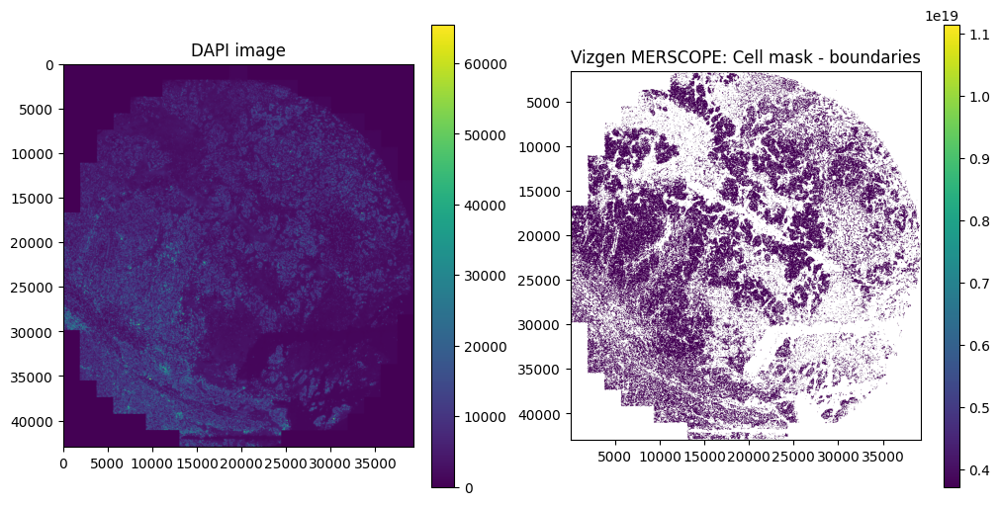

In [ ]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

# Dapi image
sdata_merscope.pl.render_images("Merscope_region_R1_z3", channel="DAPI", scale="scale4").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_merscope.tables["table"].obs["region"] = "Merscope_region_R1_polygons"
sdata_merscope.set_table_annotates_spatialelement("table", region="Merscope_region_R1_polygons")

sdata_merscope.pl.render_shapes("Merscope_region_R1_polygons", color="EntityID").pl.show(
    ax=axes[1], title="Vizgen MERSCOPE: Cell mask - boundaries", coordinate_systems="global"
)

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


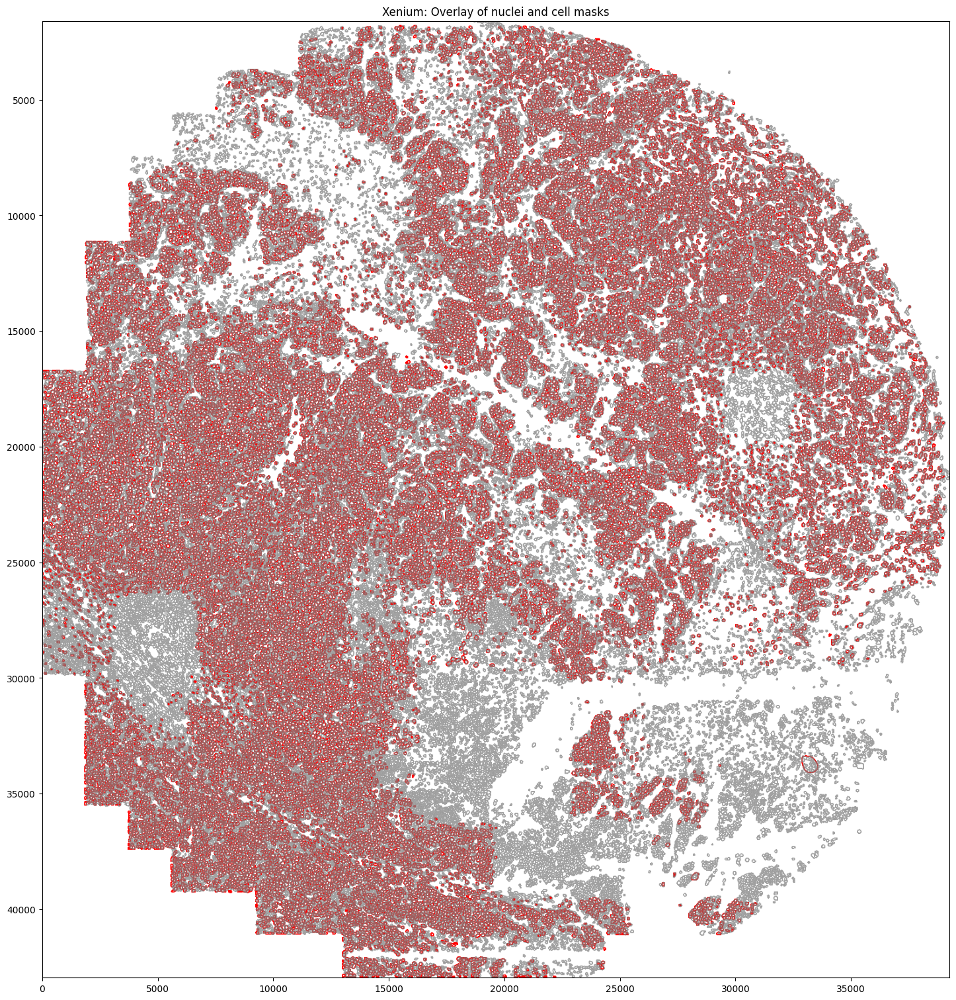

In [ ]:
axes = plt.subplots(1, 1, figsize=(15, 15), constrained_layout=True)[1]

sdata_merscope.pl.render_shapes(
    element="nucleus_boundaries",
    fill_alpha=0,
    outline_alpha=1.0,
    outline_width=0.5,
    outline_color="red",
).pl.render_shapes(
    element="Merscope_region_R1_polygons",
    fill_alpha=0.0,
    outline_alpha=0.8,
    outline_width=0.5,
    outline_color="grey",
).pl.show(ax=axes, title="Xenium: Overlay of nuclei and cell masks", colorbar=True)

*Vizgen MERSCOPE Proseg-ReSegmentation*

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:482: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     Using the datashader reduction "mean". "max" will give an output very close to the matplotlib result.     


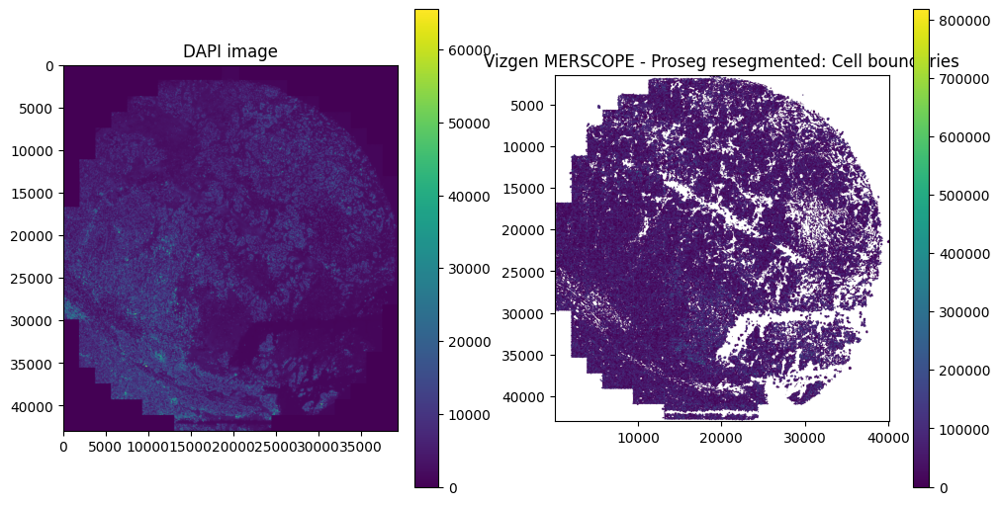

In [ ]:
axes = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)[1].flatten()

# Dapi image
sdata_proseg.pl.render_images("Merscope_region_R1_z3", channel="DAPI", scale="scale4").pl.show(
    ax=axes[0], title="DAPI image", coordinate_systems="global"
)

# Plot - Cell boundaries
sdata_proseg.tables["table"].obs["region"] = "cell_boundaries"
sdata_proseg.set_table_annotates_spatialelement("table", region="cell_boundaries")

sdata_proseg.pl.render_shapes("cell_boundaries", color="cell").pl.show(
    ax=axes[1], title="Vizgen MERSCOPE - Proseg resegmented: Cell boundaries", coordinate_systems="global"
)

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                
INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


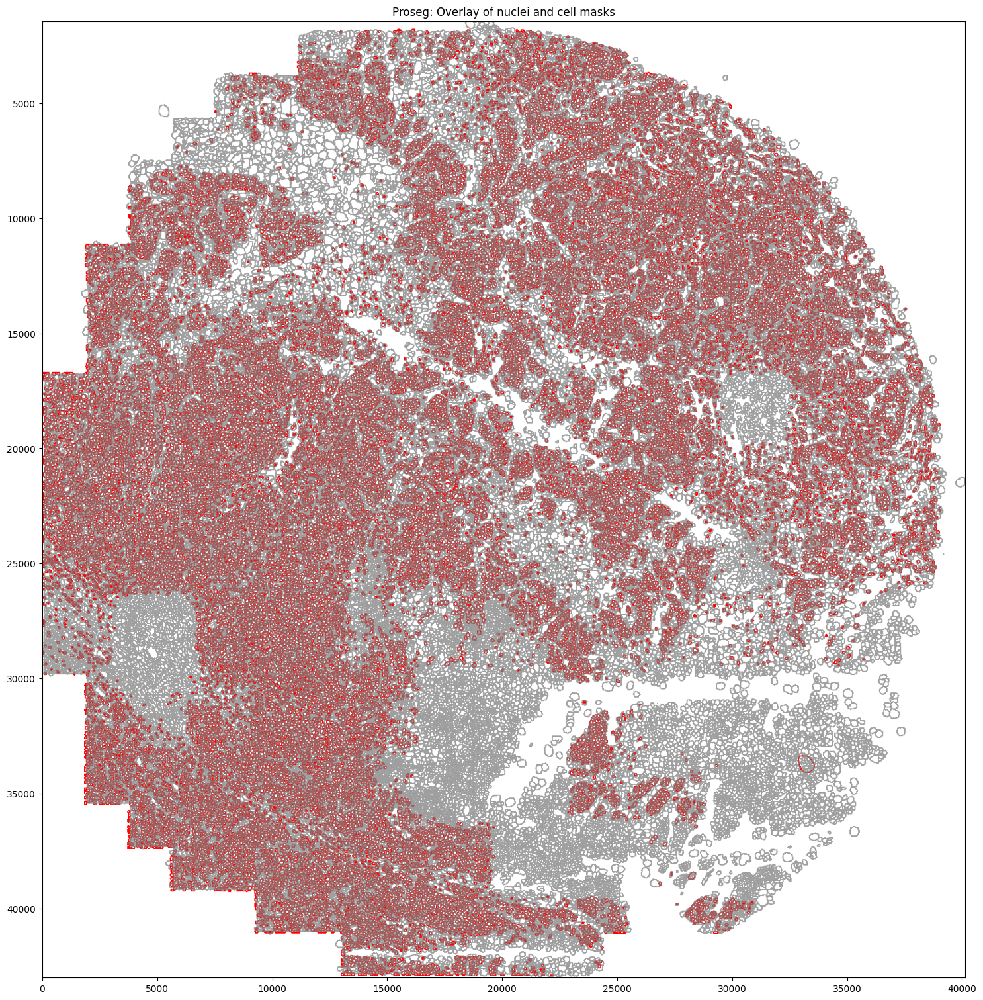

In [ ]:
axes = plt.subplots(1, 1, figsize=(15, 15), constrained_layout=True)[1]

sdata_proseg.pl.render_shapes(
    element="nucleus_boundaries",
    fill_alpha=0,
    outline_alpha=1.0,
    outline_width=0.5,
    outline_color="red",
).pl.render_shapes(
    element="cell_boundaries",
    fill_alpha=0.0,
    outline_alpha=0.8,
    outline_width=0.5,
    outline_color="grey",
).pl.show(ax=axes, title="Proseg: Overlay of nuclei and cell masks", colorbar=True)

### Running SegTraQ QC metrics

#### Baseline metrics

The baseline `bl` module allows the computation of baseline metrics such as the number of cells and the % of unassigned transcripts.

In [11]:
st_dict = {"merscope": st_merscope, "proseg": st_proseg}

In [ ]:
for method, st in st_dict.items():
    num_cells = st.bl.num_cells()
    p_unassigned = st.bl.perc_unassigned_transcripts()
    print(f"{method}: #cells: {num_cells} %unassigned: {p_unassigned}")

merscope: #cells: 92461 %unassigned: 22.61879966430826
proseg: #cells: 97642 %unassigned: 0.8696086637646814


The baseline module also facilitates the computation of morphological features.

In [18]:
for _method, st in st_dict.items():
    st.bl.morphological_features(n_jobs=8)

/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:450: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  areas = geom.area.values
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:466: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  perimeters = geom.length.values
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:495: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  convex_areas = convex_hull.area.values
/g/huber/users/lazic/src/SegTraQ/src/segtraq/bl/baseline.py:500: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use

Within computation of morphological features, the index of the `obs` is dropped - not sure why

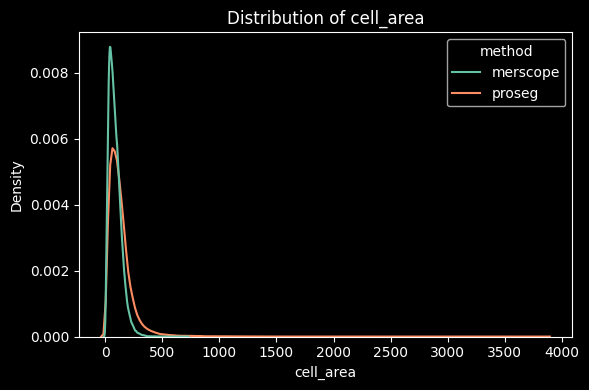

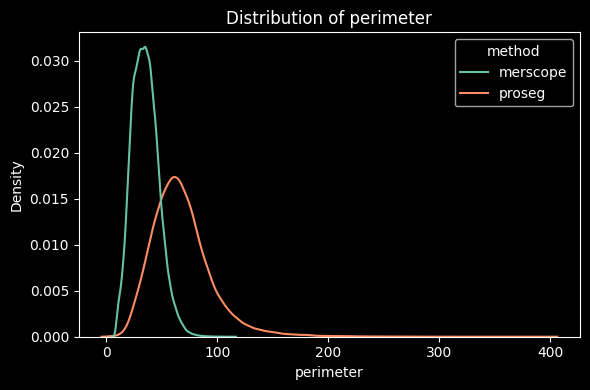

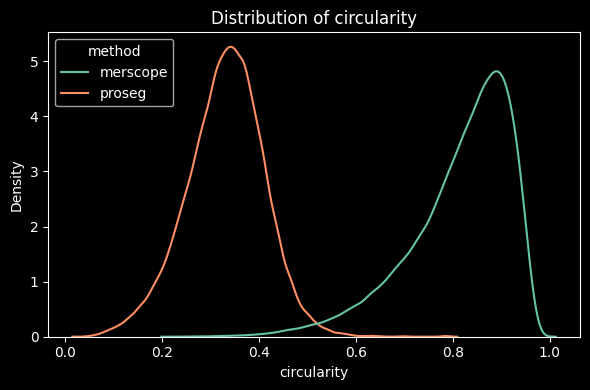

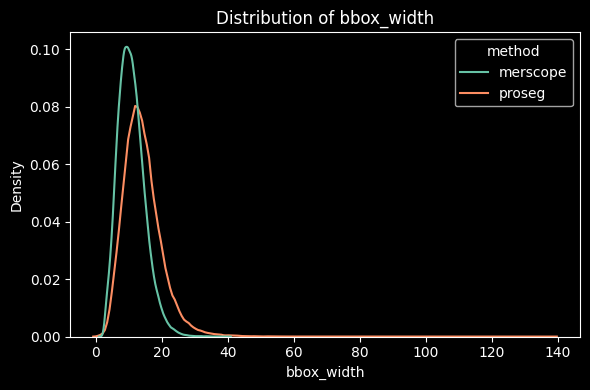

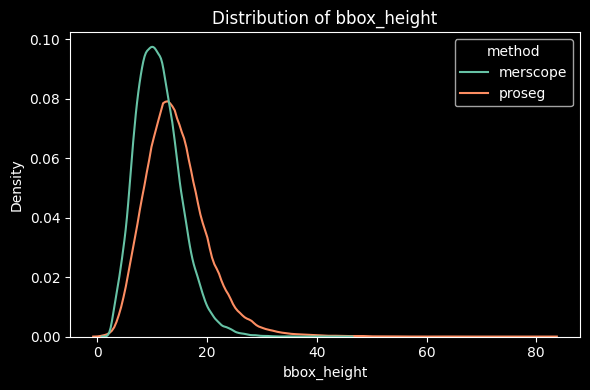

...

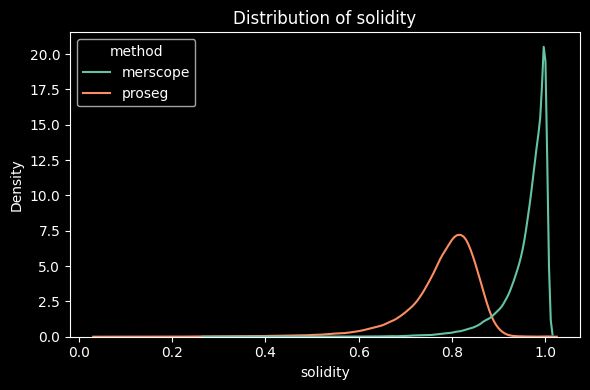

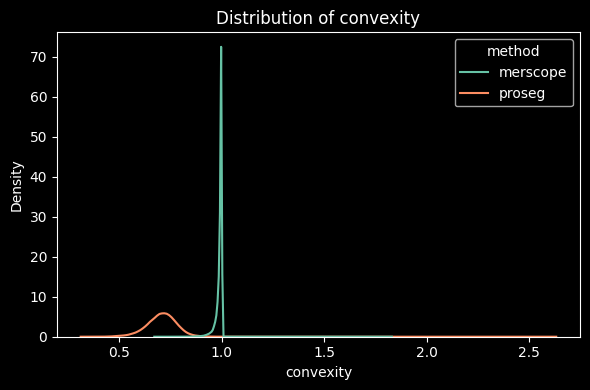

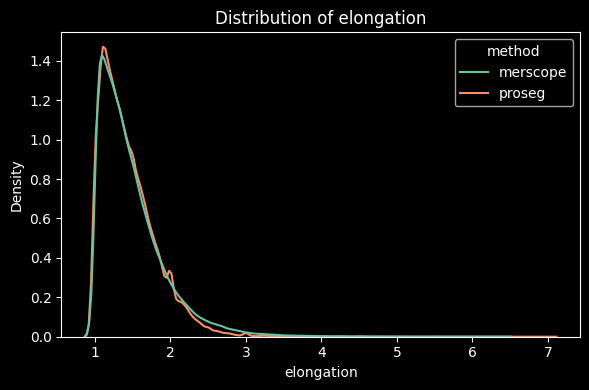

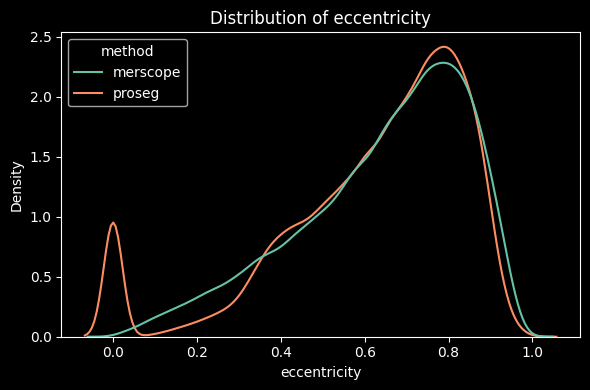

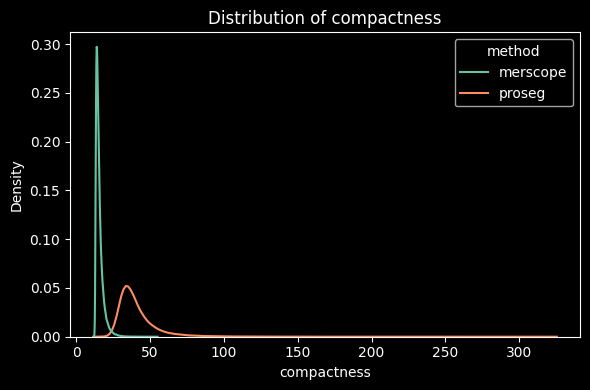

In [ ]:
plt.style.use("dark_background")

features = [
    "cell_area",
    "perimeter",
    "circularity",
    "bbox_width",
    "bbox_height",
    "extent",
    "solidity",
    "convexity",
    "elongation",
    "eccentricity",
    "compactness",
]

# Collect features into one dataframe
all_feats = []
for method, st in st_dict.items():
    feat = st.sdata["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Apply dark background globally
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
    ax.set_facecolor("black")

    sns.kdeplot(data=df, x=feat_name, hue="method", palette="Set2", common_norm=False, fill=False, ax=ax)

    # White text for readability
    ax.set_title(f"Distribution of {feat_name}")
    ax.set_xlabel(feat_name)
    ax.set_ylabel("Density")

    fig.tight_layout()
    plt.show()

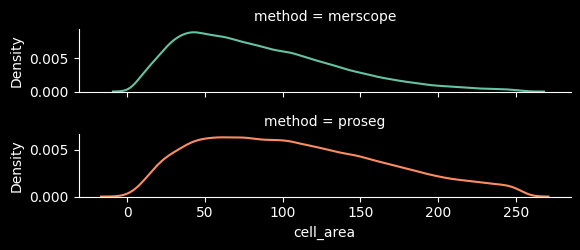

In [ ]:
methods = df["method"].unique()
palette = dict(zip(methods, sns.color_palette("Set2", len(methods)), strict=False))

g = sns.displot(
    data=df[df["cell_area"] <= df["cell_area"].quantile(0.95)],
    x="cell_area",
    hue="method",
    row="method",
    kind="kde",
    common_norm=False,
    fill=False,
    facet_kws={"sharey": False},
    palette=palette,
    height=1.3,
    aspect=4.6,
)
g._legend.remove()

#### Clustering stability metrics
The clustering stability (`cs`) module provides metrics for assessing the stability of clustering results across different resolutions and random subsets of genes.

Let`s first perform Leiden clustering and visualize these in the UMAP space.

/home/lazic/.venvs/segtraq_uv/lib/python3.12/site-packages/legacy_api_wrap/__init__.py:88: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


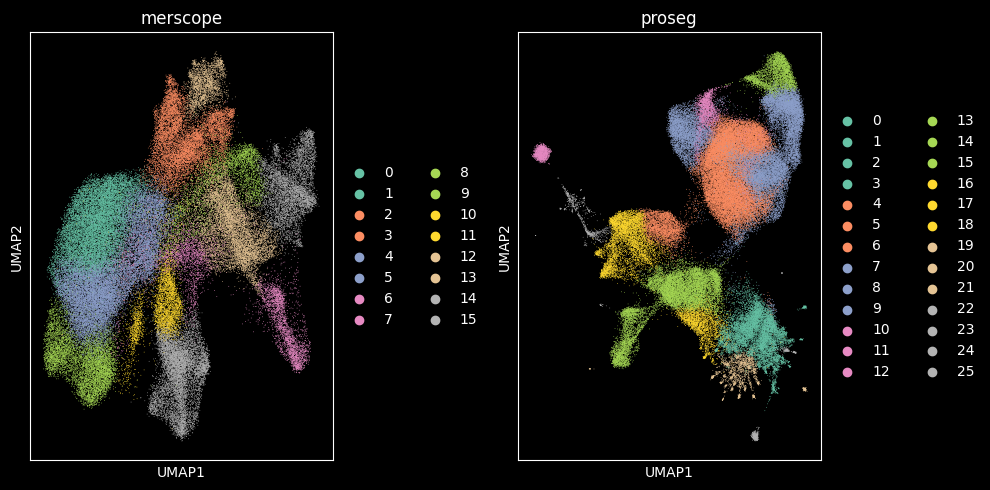

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs = axs.flatten()

for i, (method, st) in enumerate(st_dict.items()):
    adata = st.sdata.tables["table"]
    adata.layers["raw"] = adata.X.copy()
    sc.pp.normalize_total(adata, inplace=True)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, flavor="igraph", n_iterations=2)

    sc.pl.umap(
        adata,
        color="leiden",
        palette="Set2",
        ax=axs[i],
        show=False,
        title=method,
    )

plt.tight_layout()
plt.show()

Next, we compute clustering stability metrics and plot these.

In [ ]:
mcds = {}
silhouette_scores = {}
purities = {}
aris = {}

for method, st in st_dict.items():
    mcds[method] = st.cs.compute_mean_cosine_distance()
    silhouette_scores[method] = st.cs.compute_silhouette_score()
    purities[method] = st.cs.compute_purity()
    aris[method] = st.cs.compute_ari()

In [ ]:
results_df = pd.DataFrame(
    {
        "Method": list(mcds.keys()),
        "MCD": list(mcds.values()),
        "Silhouette Score": list(silhouette_scores.values()),
        "Purity": list(purities.values()),
        "ARI": list(aris.values()),
    }
)

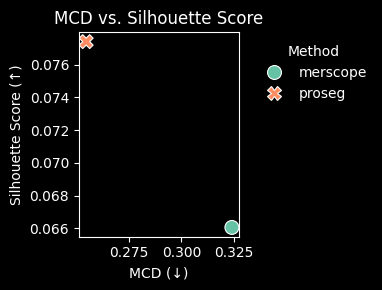

In [ ]:
fig, ax = plt.subplots(figsize=(4, 3), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="MCD",
    y="Silhouette Score",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",
    ax=ax,
)

ax.set_xlabel("MCD (↓)", color="white")
ax.set_ylabel("Silhouette Score (↑)", color="white")
ax.set_title("MCD vs. Silhouette Score", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

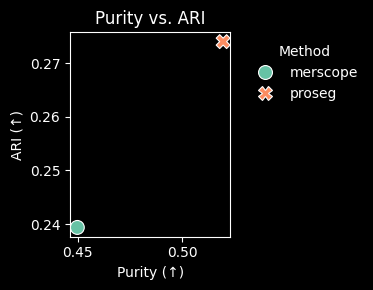

In [ ]:
# Dark style
plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(4, 3), facecolor="black")
ax.set_facecolor("black")

sns.scatterplot(
    data=results_df,
    x="Purity",
    y="ARI",
    hue="Method",
    style="Method",
    s=100,
    palette="Set2",  # consistent palette
    ax=ax,
)

ax.set_xlabel("Purity (↑)", color="white")
ax.set_ylabel("ARI (↑)", color="white")
ax.set_title("Purity vs. ARI", color="white")
ax.tick_params(colors="white")

# Legend styling
legend = ax.legend(title="Method", frameon=False, bbox_to_anchor=(1.05, 1), loc="upper left")
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

#### Supervised metrics

To enable the computation of supervised metrics, we first transfer labels from the reference scRNA-seq dataset to the spatial data using `segtraq.run_label_transfer`.

In [12]:
adata_ref = ad.read_h5ad("../../data/BC_scRNAseq_Janesick.h5ad")

In [13]:
for _method, st in st_dict.items():
    st.run_label_transfer(
        adata_ref, ref_cell_type="celltype_major", inplace=True, ref_ensemble_key=None, query_ensemble_key=None
    )

/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:229: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ref_mean_df = counts_df.groupby("celltype").mean()
/g/huber/users/lazic/src/SegTraQ/src/segtraq/SegTraQ.py:337: RuntimeWarning: Spatialdata table appears to contain raw counts. Counts will be log1p-transformed before running label transfer.Raw counts will be stored in `adata_q.layers["raw"]`.
  result = _run_label_transfer(
/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:272: ImplicitModificationWarning: Setting element `.layers['raw']` of view, initializing view as actual.
  adata_q.layers["raw"] = adata_q.X
/g/huber/users/lazic/src/SegTraQ/src/segtraq/utils.py:229: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass 

In [14]:
# Define color palette for plotting

col_celltype = {
    "T": "#fb8072",
    "B": "#bc80bd",
    "macro": "#910290",
    "dendritic": "#fdb462",
    "mast": "#959059",
    "perivas": "#fed9a6",
    "endo": "#a6cee3",
    "myoepi": "#2782bb",
    "DCIS1": "#3c7761",
    "DCIS2": "#66a61e",
    "tumor": "#66c2a5",
    "stromal": "#d45943",
    "Unknown": "#808080",
}

In [15]:
def plot_transferred_labels(sdata, boundaries_key, method):
    sdata_plot = copy.deepcopy(sdata)
    sdata_plot["table"].obs.index.name = ""
    # above required when index name matches a column name,
    # because `reset_index()` is called spatialdata_plot
    # Replace NaN with Unknown for spatialdata_plot
    s = sdata_plot.tables["table"].obs["transferred_cell_type"]
    if pd.api.types.is_categorical_dtype(s):
        s = s.cat.add_categories(["Unknown"])

    sdata_plot.tables["table"].obs["transferred_celltype_plot"] = s.fillna("Unknown")
    labels = sdata_plot.tables["table"].obs["transferred_celltype_plot"].unique().astype(str).tolist()
    cols = [col_celltype[lab] for lab in labels]

    fig, axes = plt.subplots(2, 1, figsize=(15, 15), constrained_layout=True, facecolor="black")
    axes = axes.flatten()
    for ax in axes:
        ax.set_facecolor("black")
        ax.tick_params(colors="white")
        ax.title.set_color("white")

    sdata_plot.pl.render_images("Merscope_region_R1_z3", channel="DAPI", scale="scale4").pl.show(
        ax=axes[0], title=f"{method}: DAPI image", coordinate_systems="global"
    )

    sdata_plot.tables["table"].obs["region"] = boundaries_key
    sdata_plot.set_table_annotates_spatialelement("table", region=boundaries_key)

    sdata_plot.pl.render_shapes(
        boundaries_key,
        color="transferred_celltype_plot",
        palette=cols,
        groups=labels,
        outline_color="white",
        outline_width=0.5,
    ).pl.show(
        ax=axes[1], title=f"{method}: Cell mask - boundaries colored by transferred label", coordinate_systems="global"
    )

    return fig, axes

/tmp/ipykernel_954176/747312724.py:8: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(s):


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:872: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


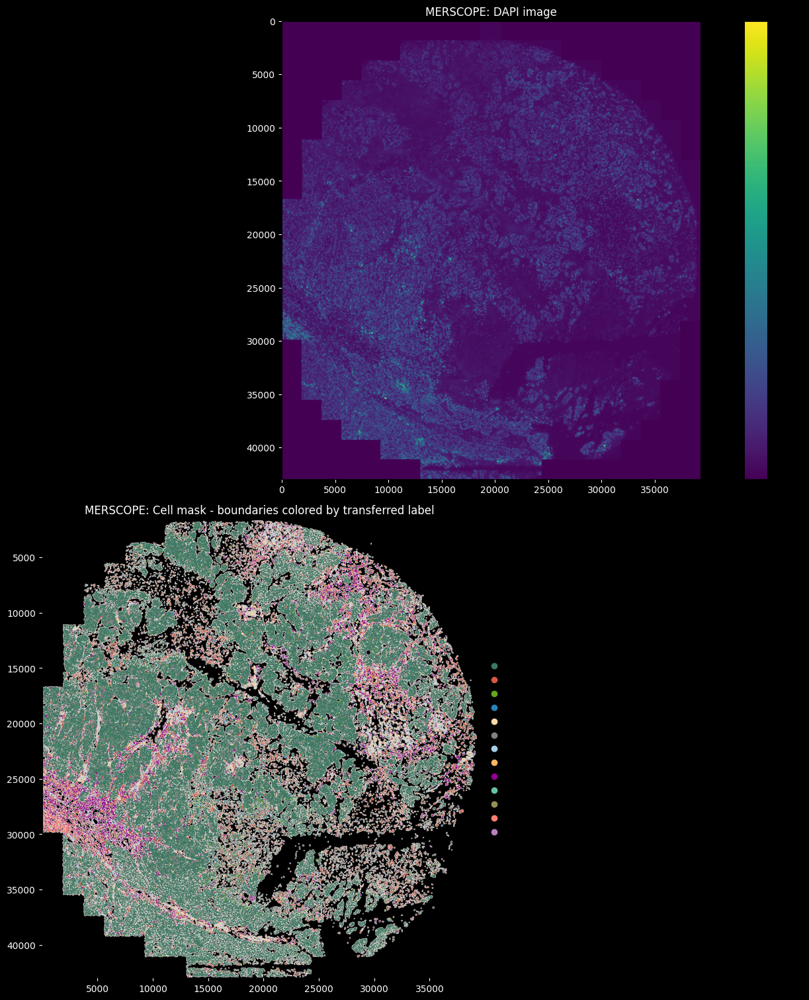

In [16]:
fig, axes = plot_transferred_labels(sdata_merscope, "Merscope_region_R1_polygons", "MERSCOPE")

/tmp/ipykernel_954176/747312724.py:8: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(s):
/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/spatialdata/_core/spatialdata.py:482: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' to disable this    
         behaviour.                                                                                                


/home/lazic/.venvs/segtraq_py311/lib/python3.11/site-packages/spatialdata_plot/pl/utils.py:872: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


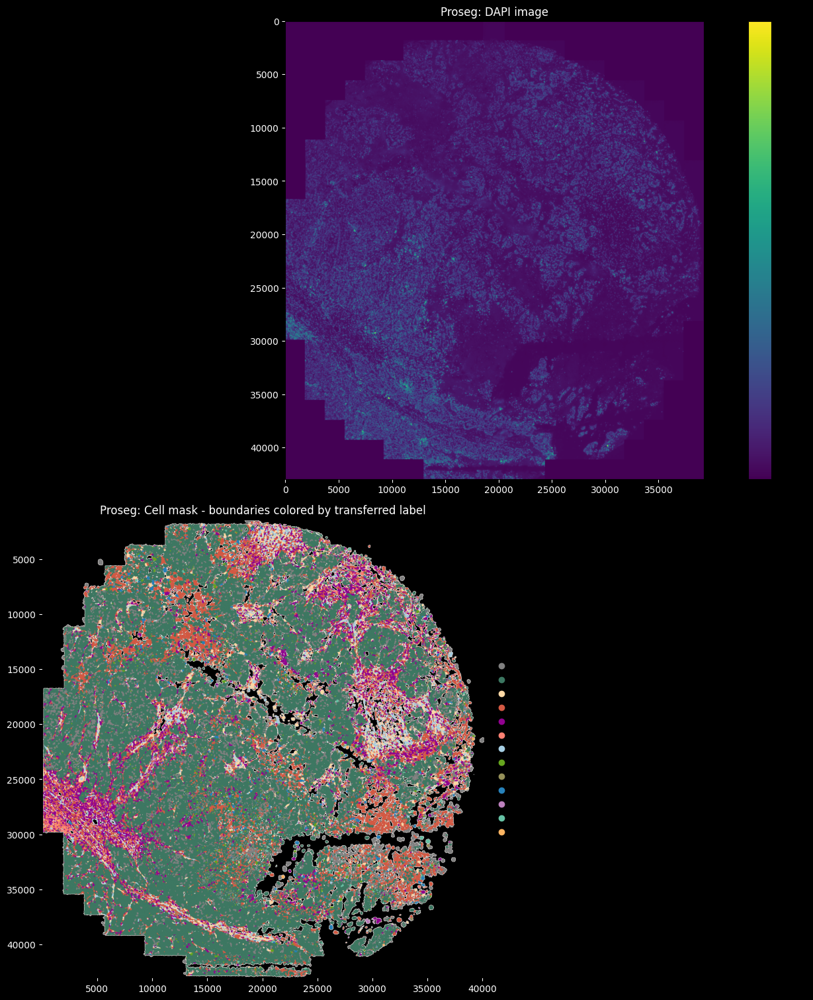

In [17]:
fig, axes = plot_transferred_labels(sdata_proseg, "cell_boundaries", "Proseg")

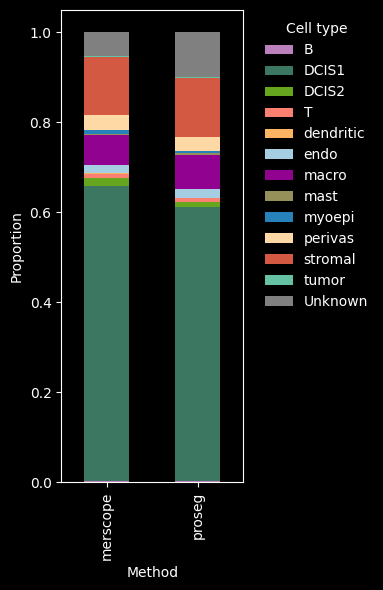

In [29]:
method_dfs = []
for method, st in st_dict.items():
    s = st.sdata.tables["table"].obs["transferred_cell_type"]
    if pd.api.types.is_categorical_dtype(s):
        s = s.cat.add_categories(["Unknown"])

    st.sdata.tables["table"].obs["transferred_celltype_plot"] = s.fillna("Unknown")
    df = st.sdata["table"].obs["transferred_celltype_plot"].value_counts(normalize=True).reset_index()
    df.columns = ["celltype", "proportion"]
    df["method"] = method
    method_dfs.append(df)

plot_df = pd.concat(method_dfs, ignore_index=True)
plot_wide = plot_df.pivot(index="method", columns="celltype", values="proportion").fillna(0)

method_order = ["merscope", "proseg"]
plot_wide = plot_wide.loc[method_order]

plt.style.use("dark_background")

fig, ax = plt.subplots(figsize=(4, 6), facecolor="black")
ax.set_facecolor("black")

plot_wide.plot(kind="bar", stacked=True, color=[col_celltype.get(c, "grey") for c in plot_wide.columns], ax=ax)

ax.set_ylabel("Proportion", color="white")
ax.set_xlabel("Method", color="white")
ax.tick_params(colors="white")

# Legend text in white
legend = ax.legend(title="Cell type", bbox_to_anchor=(1.05, 1), loc="upper left", frameon=False)
plt.setp(legend.get_texts(), color="white")
plt.setp(legend.get_title(), color="white")

fig.tight_layout()
plt.show()

In [26]:
def boxplot_per_celltype(st_dict, feature, q=1):
    dfs = []
    for method, st in st_dict.items():
        obs = st.sdata["table"].obs
        tmp = obs[["transferred_celltype_plot", feature]].copy()
        tmp["method"] = method
        dfs.append(tmp)

    df = pd.concat(dfs, ignore_index=True)
    df = df[(df[feature] <= df[feature].quantile(q))]

    fig, ax = plt.subplots(figsize=(10, 5), facecolor="black")
    ax.set_facecolor("black")

    sns.boxplot(
        data=df,
        x="transferred_celltype_plot",
        y=feature,
        hue="method",
        showcaps=True,
        showfliers=False,
        palette="Set2",
        ax=ax,
    )

    handles, labels = ax.get_legend_handles_labels()
    n_methods = df["method"].nunique()
    legend = ax.legend(
        handles[:n_methods],
        labels[:n_methods],
        title="Method",
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        frameon=False,
    )

    plt.setp(legend.get_texts(), color="white")
    plt.setp(legend.get_title(), color="white")

    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")
    ax.set_xlabel("Cell type", color="white")
    ax.set_ylabel(feature, color="white")
    ax.tick_params(colors="white")

    fig.tight_layout()
    plt.show()

/tmp/ipykernel_579882/2808241474.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


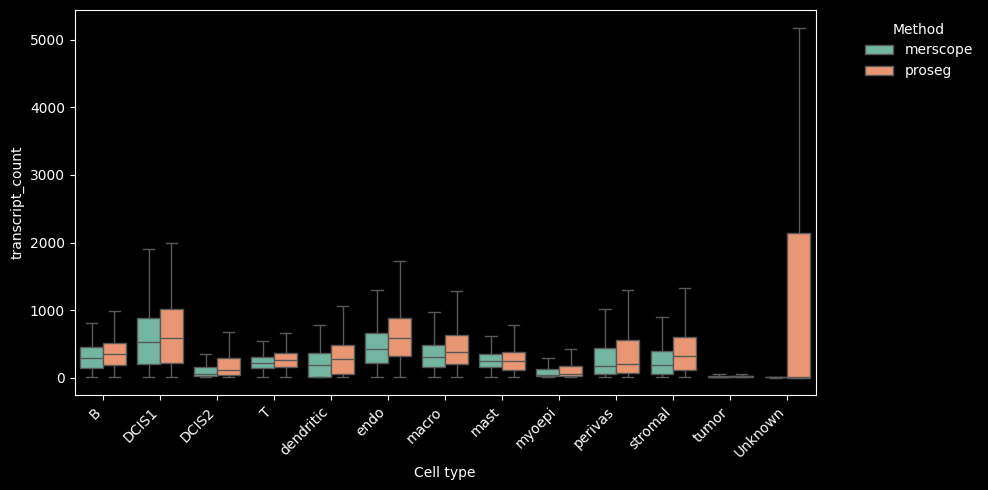

In [ ]:
boxplot_per_celltype(st_dict, "transcript_count")

The supervised metrics module (`sp`) provides metrics to compare the spatial single cell expression profiles to those from a single-cell RNA sequencing dataset.

In [ ]:
for _method, st in st_dict.items():
    tbl = st.sdata["table"]
    common_genes = tbl.var_names[tbl.var_names.isin(adata_ref.var_names)]
    adata_ref = adata_ref[:, common_genes].copy()

    markers = segtraq.markers_from_reference(adata_ref, ref_cell_type="celltype_major", q_pos=0.95, q_neg=0.1, t=0.25)

    st.sp.calculate_marker_purity(cell_type_key="transferred_cell_type", markers=markers)

/tmp/ipykernel_579882/2808241474.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


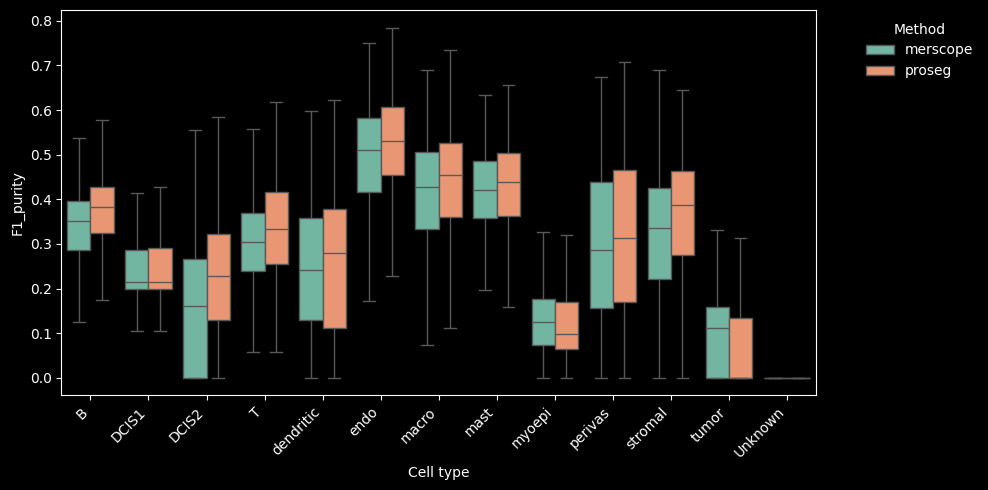

In [ ]:
boxplot_per_celltype(st_dict, "F1_purity")

/tmp/ipykernel_579882/2808241474.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", color="white")


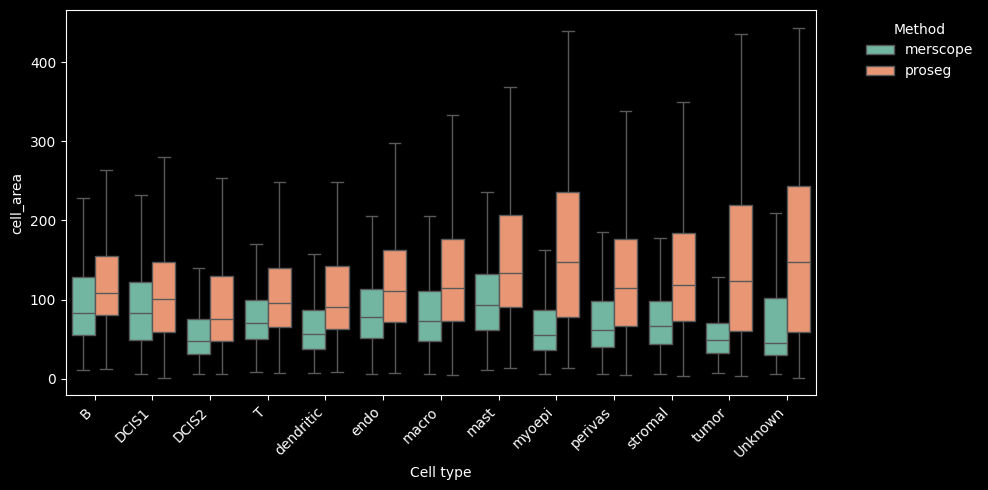

In [ ]:
boxplot_per_celltype(st_dict, "cell_area", q=0.99)

#### Region correlation metrics

The region correlation module provides metrics to evaluate how well subcellular regions align
- IoU between each cell and its best-matching nucleus
- Correlation between per-cell expression and its matched nucleus
- Correlation between the cell's nucleus-overlap part vs. remainder (vectorized)
- Correlation of gene expression in an eroded interior ("center") and a thin outer shell ("border"), (2) in the border and the neighborhood composition vector (NCV), and ratio between the two.

This takes about 28min for both SpatialData objects (Merscope original and Proseg re-segmentation) of the large Merscope dataset. 

In [ ]:
for _method, st in st_dict.items():
    st.rc.compute_cell_nuc_ious(n_jobs=-1)
    st.rc.compute_correlation_between_parts(n_jobs=-1)
    st.rc.compute_cell_nuc_correlation(n_jobs_iou=-1)
    st.rc.compute_center_border_ncv_correlation()

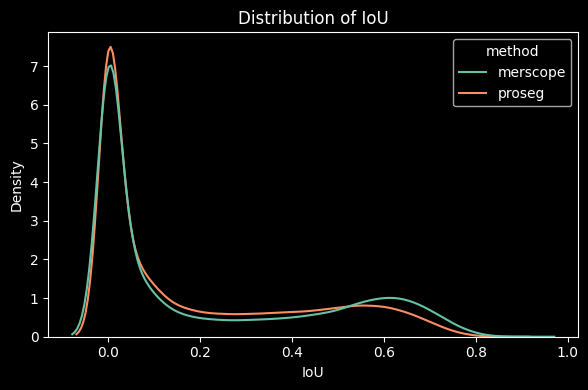

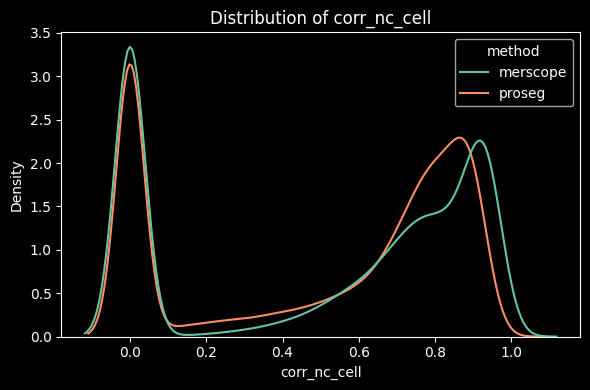

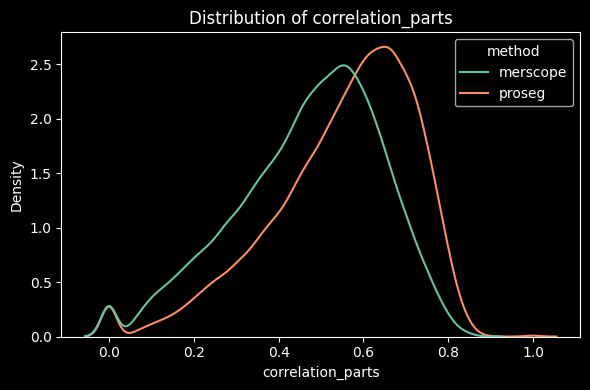

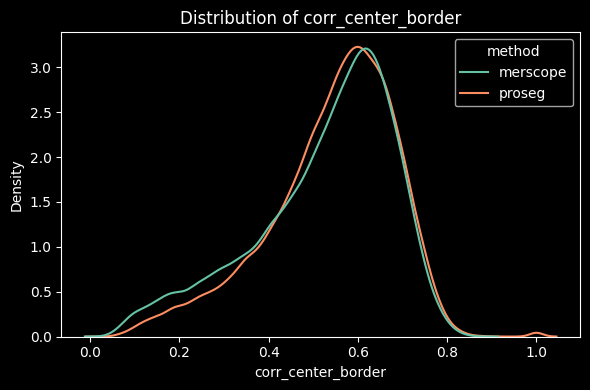

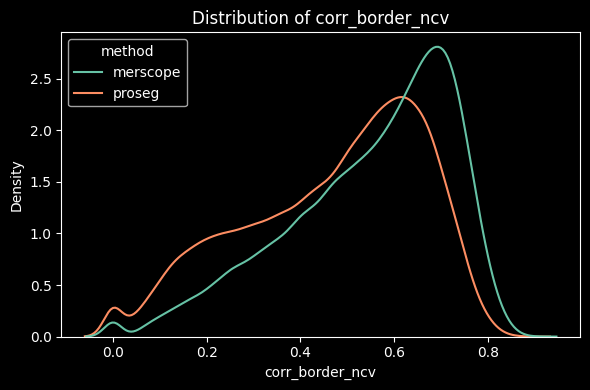

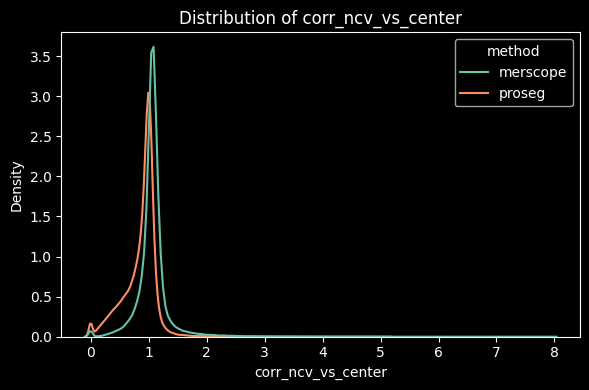

In [20]:
features = ["IoU", "corr_nc_cell", "correlation_parts", "corr_center_border", "corr_border_ncv", "corr_ncv_vs_center"]

# Collect features into one dataframe
all_feats = []

for method, st in st_dict.items():
    feat = st.sdata["table"].obs[features]
    tmp = feat.copy()
    tmp["method"] = method
    all_feats.append(tmp)

df = pd.concat(all_feats, ignore_index=True)
df["method"] = df["method"].astype(str)

feature_cols = [c for c in df.columns if c != "method"]

# Dark style once
plt.style.use("dark_background")

for feat_name in feature_cols:
    fig, ax = plt.subplots(figsize=(6, 4), facecolor="black")
    ax.set_facecolor("black")

    sns.kdeplot(data=df, x=feat_name, hue="method", common_norm=False, palette="Set2", fill=False, ax=ax)

    ax.set_title(f"Distribution of {feat_name}", color="white")
    ax.set_xlabel(feat_name, color="white")
    ax.set_ylabel("Density", color="white")
    ax.tick_params(colors="white")

    fig.tight_layout()
    plt.show()

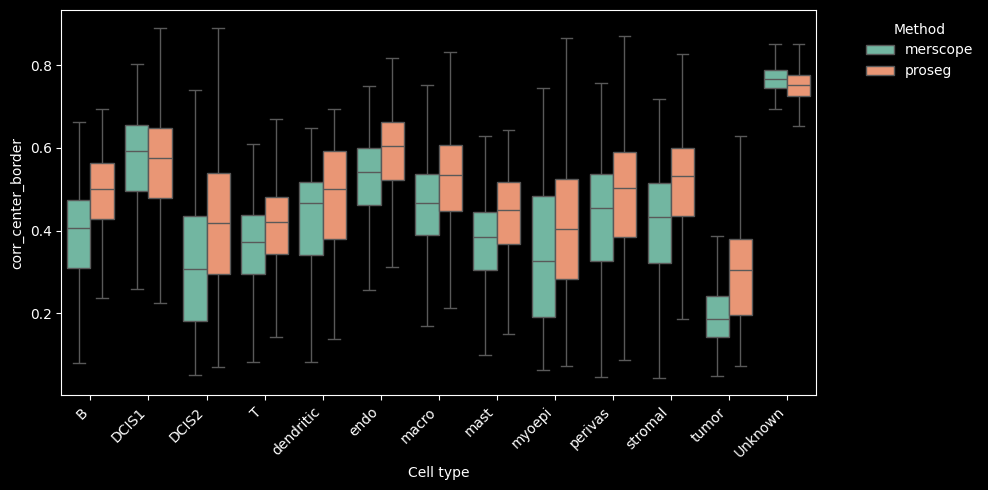

In [30]:
boxplot_per_celltype(st_dict, "corr_center_border")

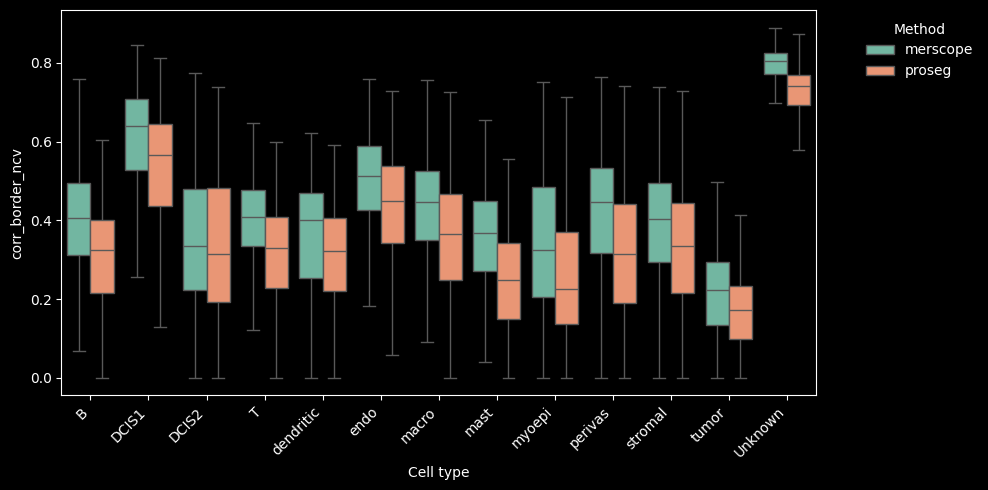

In [31]:
boxplot_per_celltype(st_dict, "corr_border_ncv")

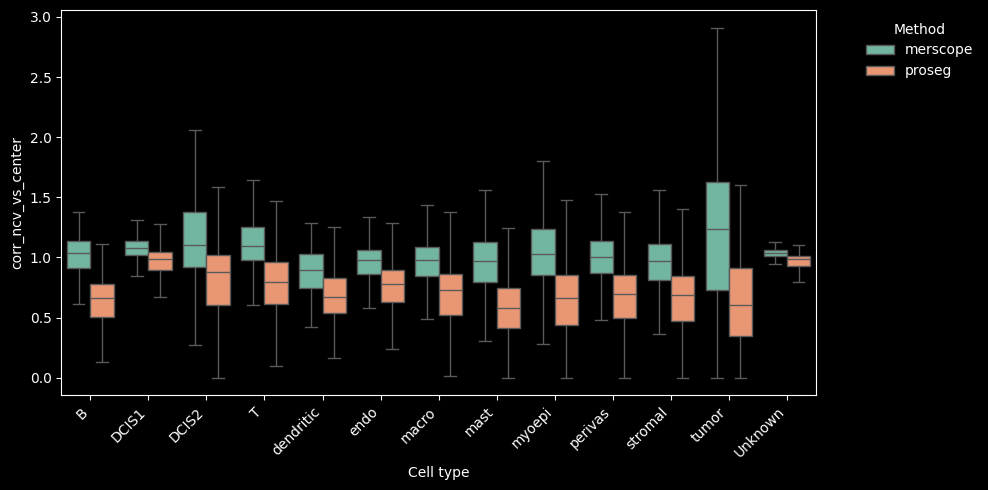

In [32]:
boxplot_per_celltype(st_dict, "corr_ncv_vs_center")

How do these correlate with expression purity and cell area:

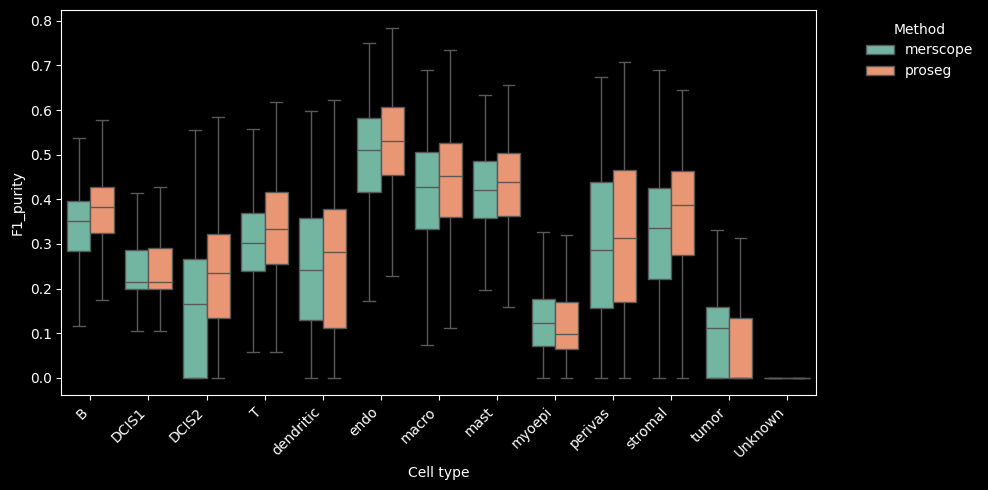

In [35]:
boxplot_per_celltype(st_dict, "F1_purity")

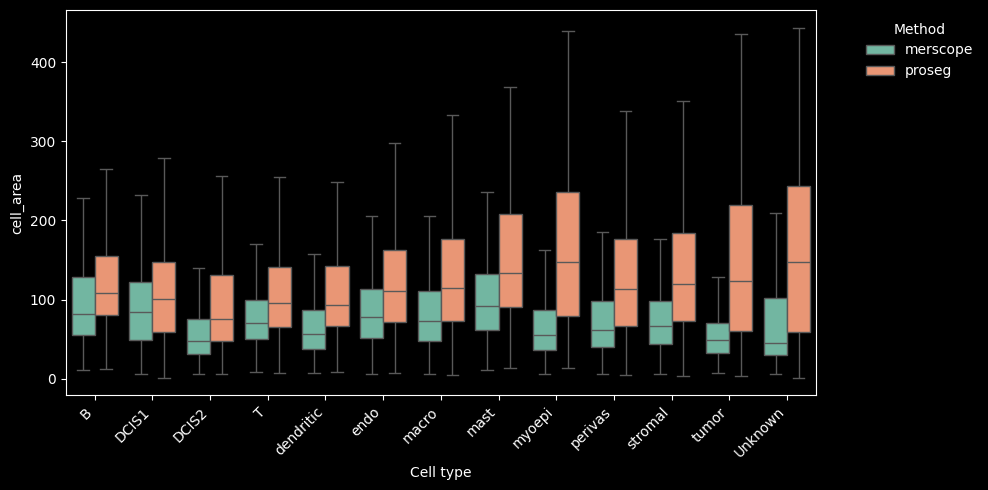

In [36]:
boxplot_per_celltype(st_dict, "cell_area", q=0.99)